## Problem Statement

A portfolio manager makes investment decisions and carries out other related activities on behalf of vested investors.
They work with a team of analysts and researchers, and their main objective is to realise the needs of the investor and suggest a suitable portfolio that meets all the expectations. They are responsible for establishing the best investment strategy, selecting appropriate investments along with the right allocation.
As a portfolio manager my role requires to analyse a portfolio of stocks to provide consultation on investment management based on client’s requirement.

CRISP DM framework will be employed to solve this problem. Steps will be followed in the order in which we analyse, breakdown and arrive at the solution.
##### Steps Followed
    1) Business understanding
    2) Data understanding
    3) Data Preparation
    4) Data Modelling
    5) Model Evaluation

## Business understanding

#### Investor persona and investment goals 
The potential client who require analysis for her investment is Ms.Alexandra Kolishnyick.
She is the daughter of a famous Ukrainian business tycoon. She has mostly been in U.S. for her schooling. She is a good student and could get in an Ivy League college for her Bachelor's presently.
She intends to form an NGO later with her batchmates to support sub-Saharan African region and is emotionally supported by family over the same.
She has huge savings from the money sent by her parents and wants to invest it during her college to use matured amount for NGO.
She is not eager to disclose any information on investment amount. She is conservative and wants to invest in stocks which shows promise but are also stable. She wants a comprehensive report on all the metrics used to devise the investment strategy.

1. Business Case Understanding: Understand the business context, Investor persona and investment goals of the investor.
2. Data Analysis and Visualization: Determine key risk and return metrics of the stock. Compare the same with the market.
3. Selection of stocks using CAPM: Use regression analysis to determine beta values and expected returns using CAPM method. 
    Based on this and portfolio objective select the stocks.
4. ML model for stock price prediction: Use appropriate time-series ML model to predict future stock prices.

## Data Understanding

In [1]:
#import required libraries
import pandas as pd
import seaborn as sns
from statistics import mean
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly

# Import Statsmodels
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Read all the given CSV files for different sectors, and view some sample records
AAL = pd.read_csv('BA_Dataset\Aviation\AAL.csv')
ALK = pd.read_csv('BA_Dataset\Aviation\ALK.csv')
HA = pd.read_csv('BA_Dataset\Aviation\HA.csv')

CS = pd.read_csv('BA_Dataset\Finance\CS.csv')
DB = pd.read_csv('BA_Dataset\Finance\DB.csv')
GS = pd.read_csv('BA_Dataset\Finance\GS.csv')

BHC = pd.read_csv('BA_Dataset\Healthcare_Pharma\BHC.csv')
JNJ = pd.read_csv('BA_Dataset\Healthcare_Pharma\JNJ.csv')
MRK = pd.read_csv('BA_Dataset\Healthcare_Pharma\MRK.csv')

AAPL = pd.read_csv('BA_Dataset\Technology\AAPL.csv')
AMZN = pd.read_csv('BA_Dataset\Technology\AMZN.csv')
GOOG = pd.read_csv('BA_Dataset\Technology\GOOG.csv')

SP500 = pd.read_csv('BA_Dataset\S&P500.csv')

SP500.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000


In [3]:
# Merge all the dataframes into a single dataframe using column 'close'
Stock_prices = pd.concat([SP500['Date'],AAL['Close'], ALK['Close'], HA['Close'], CS['Close'], DB['Close'], GS['Close'], BHC['Close'],
                    JNJ['Close'], MRK['Close'], AAPL['Close'], AMZN['Close'], GOOG['Close'], 
                    SP500['Close']], axis=1, join='inner')
# Rename those columns in a new dataframe
Stock_prices.columns = ['Date','AAL_price', 'ALK_price', 'HA_price','CS_price', 'DB_price', 'GS_price','BHC_price', 'JNJ_price', 
                        'MRK_price','AAPL_price','AMZN_price', 'GOOG_price', 'SP500_price']
Stock_prices.head()

,Date,AAL_price,ALK_price,HA_price,CS_price,DB_price,GS_price,BHC_price,JNJ_price,MRK_price,AAPL_price,AMZN_price,GOOG_price,SP500_price
0,01-10-2010,9.29,12.4475,5.96,50.771484,69.875954,173.080002,25.750000,61.750000,36.599998,10.090000,153.710007,261.828613,1146.239990
1,04-10-2010,9.12,12.1425,5.75,51.191406,71.211830,176.139999,25.870001,61.669998,36.520000,9.951428,155.389999,260.199707,1137.030029
2,05-10-2010,9.23,12.2150,5.85,50.478516,69.980919,174.259995,26.299999,62.799999,37.020000,10.319285,160.869995,268.110046,1160.750000
3,06-10-2010,9.23,12.1875,5.97,52.519531,70.772903,177.669998,26.690001,63.209999,37.009998,10.328215,155.399994,266.177307,1159.969971
4,07-10-2010,9.24,11.6250,6.15,53.291016,73.330154,174.309998,26.600000,63.220001,36.709999,10.329286,156.270004,264.015411,1158.060059


### Missing Values

In [4]:
Stock_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         2517 non-null   object 
 1   AAL_price    2517 non-null   float64
 2   ALK_price    2517 non-null   float64
 3   HA_price     2517 non-null   float64
 4   CS_price     2517 non-null   float64
 5   DB_price     2517 non-null   float64
 6   GS_price     2517 non-null   float64
 7   BHC_price    2517 non-null   float64
 8   JNJ_price    2517 non-null   float64
 9   MRK_price    2517 non-null   float64
 10  AAPL_price   2517 non-null   float64
 11  AMZN_price   2517 non-null   float64
 12  GOOG_price   2517 non-null   float64
 13  SP500_price  2517 non-null   float64
dtypes: float64(13), object(1)
memory usage: 275.4+ KB


##### There are no missing values in the dataframe

In [5]:
## let's look at the statistical aspects of the dataframe
Stock_prices.describe()

,AAL_price,ALK_price,HA_price,CS_price,DB_price,GS_price,BHC_price,JNJ_price,MRK_price,AAPL_price,AMZN_price,GOOG_price,SP500_price
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,29.397636,50.031176,22.870413,24.010132,31.353796,176.014712,61.880687,105.277378,57.161053,33.454670,854.636107,730.426139,2111.392732
std,15.211889,24.187020,15.483034,10.210373,17.060609,42.062407,57.170002,28.174233,15.164505,20.630118,745.201139,364.685720,612.227235
min,4.000000,11.620000,3.780000,10.210000,6.440000,87.699997,8.510000,57.660000,29.809999,9.951428,153.029999,236.553345,1099.229980
25%,13.010000,26.780001,7.030000,15.010000,16.389999,151.009995,22.170000,81.930000,45.730000,18.961428,266.489990,403.642059,1562.170044
50%,32.520000,58.540001,21.910000,23.535156,31.969999,169.600006,38.759998,104.040001,57.180000,27.592501,533.750000,651.789978,2071.219971
75%,42.200001,67.260002,36.900002,29.350000,43.759541,207.210007,90.269997,130.979996,64.089996,42.962502,1500.000000,1055.810059,2656.300049
max,58.470001,100.239998,60.299999,53.291016,77.977097,273.380005,262.519989,155.509995,92.040001,134.179993,3531.449951,1728.280029,3580.840088


In [6]:
# Creating sector-wise dataframe
Stock_indexed = Stock_prices.copy(deep=True)
Stock_indexed.set_index("Date", inplace = True)
Aviation = Stock_indexed[['AAL_price', 'ALK_price', 'HA_price']]
Finance = Stock_indexed[['CS_price', 'DB_price', 'GS_price']]
Healthcare_Pharma = Stock_indexed[['BHC_price', 'JNJ_price', 'MRK_price']]
Technology = Stock_indexed[['AAPL_price','AMZN_price', 'GOOG_price']]

## Exploratory Data Analysis and Visualizations

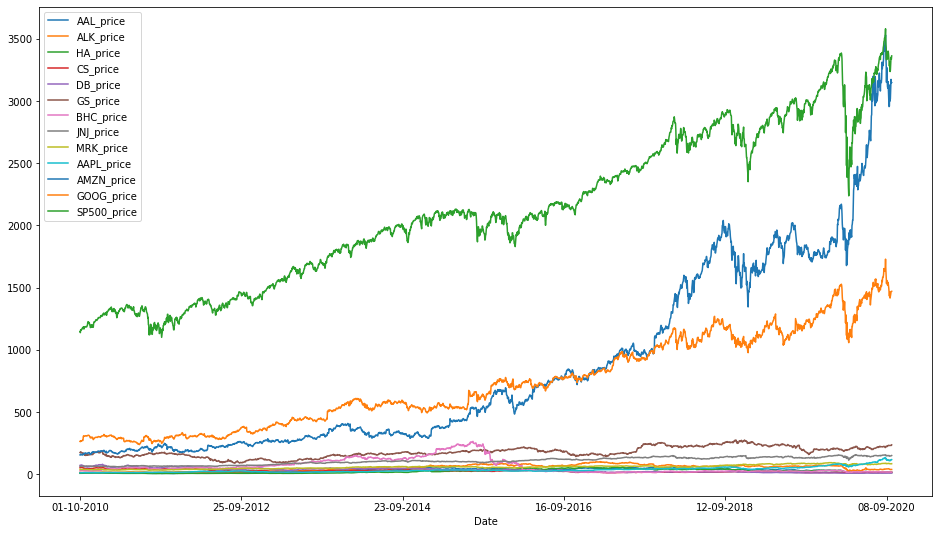

In [7]:
# Let's see a historical view of the closing price
Stock_indexed.plot(legend=True, figsize=(16,9))

### Distribution Plots

### Min value of stocks

In [8]:
min_vol_port = Stock_indexed.min()                             
min_vol_port

AAL_price         4.000000
ALK_price        11.620000
HA_price          3.780000
CS_price         10.210000
DB_price          6.440000
GS_price         87.699997
BHC_price         8.510000
JNJ_price        57.660000
MRK_price        29.809999
AAPL_price        9.951428
AMZN_price      153.029999
GOOG_price      236.553345
SP500_price    1099.229980
dtype: float64

### Max value of stocks

In [9]:
max_vol_port = Stock_indexed.max()                             
max_vol_port

AAL_price        58.470001
ALK_price       100.239998
HA_price         60.299999
CS_price         53.291016
DB_price         77.977097
GS_price        273.380005
BHC_price       262.519989
JNJ_price       155.509995
MRK_price        92.040001
AAPL_price      134.179993
AMZN_price     3531.449951
GOOG_price     1728.280029
SP500_price    3580.840088
dtype: float64

### Calculating Daily returns of stocks

In [10]:
# Function to calculate the daily returns 
def daily_return(df):

  df_daily_return = df.copy()
  
  # Loop through each stock
  for i in df.columns[1:]:
    
    # Loop through each row belonging to the stock
    for j in range(1, len(df)):
      
      # Calculate the percentage of change from the previous day
      df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1]) * 100
    
    # set the value of first row to zero, as previous value is not available
    df_daily_return[i][0] = 0
  return df_daily_return

In [11]:
# Get the daily returns 
stocks_daily_return = daily_return(Stock_prices)
stocks_daily_return.head()

,Date,AAL_price,ALK_price,HA_price,CS_price,DB_price,GS_price,BHC_price,JNJ_price,MRK_price,AAPL_price,AMZN_price,GOOG_price,SP500_price
0,01-10-2010,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,04-10-2010,-1.829925,-2.450291,-3.523490,0.827082,1.911782,1.767967,0.466023,-0.129558,-0.218574,-1.373360,1.092962,-0.622127,-0.803493
2,05-10-2010,1.206140,0.597076,1.739130,-1.392597,-1.728520,-1.067335,1.662149,1.832335,1.369113,3.696525,3.526608,3.040103,2.086134
3,06-10-2010,0.000000,-0.225133,2.051282,4.043334,1.131714,1.956848,1.482897,0.652866,-0.027018,0.086537,-3.400262,-0.720875,-0.067200
4,07-10-2010,0.108342,-4.615385,3.015075,1.468949,3.613319,-1.891147,-0.337209,0.015823,-0.810589,0.010370,0.559852,-0.812201,-0.164652


#### Min Daily Return

In [12]:
min_daily_return = stocks_daily_return.min()                            
min_daily_return.iloc[1:]

AAL_price     -25.2246
ALK_price     -23.2385
HA_price      -26.9722
CS_price      -16.1079
DB_price      -17.4888
GS_price       -12.791
BHC_price     -51.4629
JNJ_price     -10.0379
MRK_price     -8.89903
AAPL_price    -12.8647
AMZN_price    -12.6568
GOOG_price    -11.1008
SP500_price   -11.9841
dtype: object

#### Max Daily Return

In [13]:
max_daily_return = stocks_daily_return.max()                             
max_daily_return.iloc[1:]

AAL_price       41.097
ALK_price      20.3079
HA_price       24.5837
CS_price       14.2959
DB_price       17.9506
GS_price       9.54366
BHC_price      33.7444
JNJ_price      7.99772
MRK_price       10.408
AAPL_price     11.9808
AMZN_price     15.7457
GOOG_price     16.0524
SP500_price    9.38277
dtype: object

#### Log Of Percentage Change

In [14]:
# Log of percentage change
cov_matrix = Stock_indexed.pct_change().apply(lambda x: np.log(1+x)).cov()
cov_matrix.head(5)

,AAL_price,ALK_price,HA_price,CS_price,DB_price,GS_price,BHC_price,JNJ_price,MRK_price,AAPL_price,AMZN_price,GOOG_price,SP500_price
AAL_price,0.001045,0.000530,0.000605,0.000023,0.000029,0.000018,0.000273,0.000083,0.000099,0.000155,0.000142,0.000142,1.625093e-04
ALK_price,0.000530,0.000565,0.000464,0.000010,0.000010,0.000006,0.000244,0.000079,0.000096,0.000138,0.000129,0.000138,1.500976e-04
HA_price,0.000605,0.000464,0.000924,0.000017,0.000028,0.000006,0.000219,0.000080,0.000095,0.000141,0.000118,0.000129,1.503708e-04
CS_price,0.000023,0.000010,0.000017,0.000434,0.000410,0.000211,0.000020,0.000008,0.000009,-0.000012,-0.000002,-0.000007,-2.971807e-07
DB_price,0.000029,0.000010,0.000028,0.000410,0.000634,0.000266,0.000028,0.000006,0.000007,-0.000018,-0.000004,-0.000017,-1.887766e-06


### Risk / Volatility

In [15]:
# Volatility is given by the annual standard deviation. We multiply by 252 because there are 252 trading days/year.
stocks_indexed_return = stocks_daily_return.copy(deep = True)
stocks_indexed_return.set_index('Date',inplace= True)
stocks_indexed_return.dropna()
ann_sd = stocks_indexed_return.std()
ann_sd

AAL_price      3.271920
ALK_price      2.355780
HA_price       3.014129
CS_price       2.072648
DB_price       2.515000
GS_price       1.641620
BHC_price      3.569255
JNJ_price      1.084463
MRK_price      1.304615
AAPL_price     1.771503
AMZN_price     1.988550
GOOG_price     1.628458
SP500_price    1.093199
dtype: float64

### Cumulative returns

In [16]:
#Cumulative returns for each stock
new = Stock_indexed.pct_change()
cumulative_returns = (new + 1).cumprod()
cumulative_returns.tail(5)

,AAL_price,ALK_price,HA_price,CS_price,DB_price,GS_price,BHC_price,JNJ_price,MRK_price,AAPL_price,AMZN_price,GOOG_price,SP500_price
Date,,,,,,,,,,,,,
24-09-2020,1.266954,2.868046,2.080537,0.261170,0.109623,1.335856,0.591068,2.342834,2.271858,10.725471,19.646021,5.455057,2.832382
25-09-2020,1.322928,2.948383,2.147651,0.264125,0.109623,1.332679,0.594175,2.358866,2.265847,11.127849,20.136164,5.518724,2.877635
28-09-2020,1.373520,3.015867,2.244966,0.264519,0.110481,1.327710,0.593010,2.382348,2.261202,11.393459,20.649599,5.593430,2.923995
29-09-2020,1.318622,2.945973,2.157718,0.264912,0.111340,1.328461,0.577864,2.381538,2.237705,11.307234,20.459825,5.611801,2.909923
30-09-2020,1.322928,2.942760,2.162752,0.270821,0.119211,1.353825,0.603495,2.411012,2.266393,11.477700,20.484873,5.612832,2.933941


Text(0.5, 1.0, 'Google')

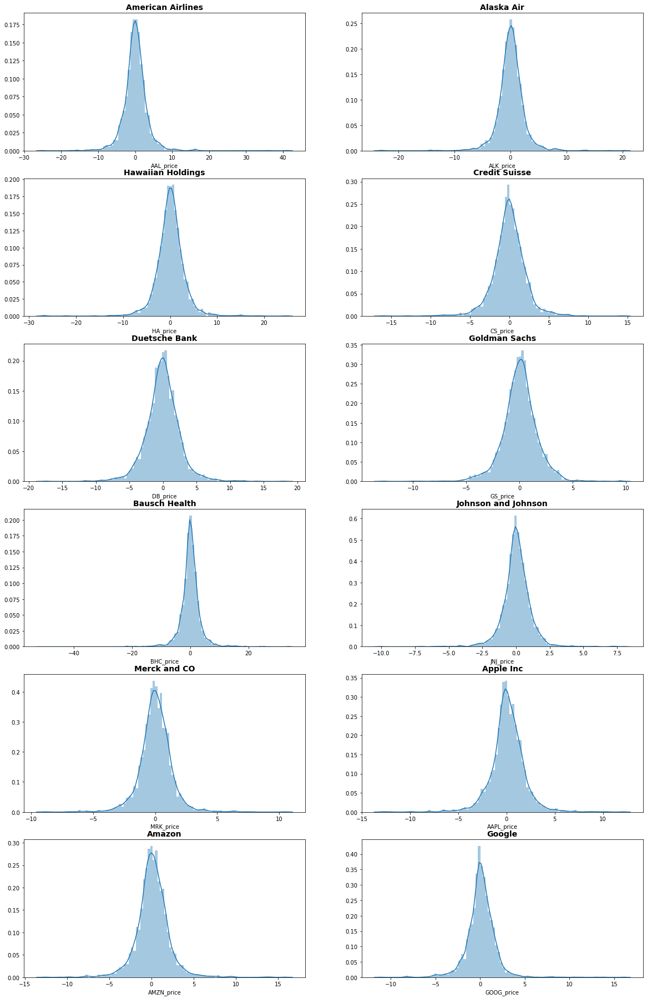

In [17]:
# Dispersion of stock prices from mean
fig, axes = plt.subplots(nrows=6, ncols=2)

fig.set_figheight(32)
fig.set_figwidth(20)

sns.distplot(stocks_daily_return['AAL_price'].dropna(), bins=100, ax=axes[0,0])
axes[0,0].set_title('American Airlines', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['ALK_price'].dropna(), bins=100, ax=axes[0,1])
axes[0,1].set_title('Alaska Air', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['HA_price'].dropna(), bins=100, ax=axes[1,0])
axes[1,0].set_title('Hawaiian Holdings', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['CS_price'].dropna(), bins=100, ax=axes[1,1])
axes[1,1].set_title('Credit Suisse', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['DB_price'].dropna(), bins=100, ax=axes[2,0])
axes[2,0].set_title('Duetsche Bank', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['GS_price'].dropna(), bins=100, ax=axes[2,1])
axes[2,1].set_title('Goldman Sachs', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['BHC_price'].dropna(), bins=100, ax=axes[3,0])
axes[3,0].set_title('Bausch Health', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['JNJ_price'].dropna(), bins=100, ax=axes[3,1])
axes[3,1].set_title('Johnson and Johnson', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['MRK_price'].dropna(), bins=100, ax=axes[4,0])
axes[4,0].set_title('Merck and CO', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['AAPL_price'].dropna(), bins=100, ax=axes[4,1])
axes[4,1].set_title('Apple Inc', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['AMZN_price'].dropna(), bins=100, ax=axes[5,0])
axes[5,0].set_title('Amazon', fontsize=14, fontweight='bold')

sns.distplot(stocks_daily_return['GOOG_price'].dropna(), bins=100, ax=axes[5,1])
axes[5,1].set_title('Google', fontsize=14, fontweight='bold')

#### All the Stocks are normally distributed.

### Moving Averages
#### 50 and 200 days moving average for all stocks

Text(0.5, 1.0, 'Google')

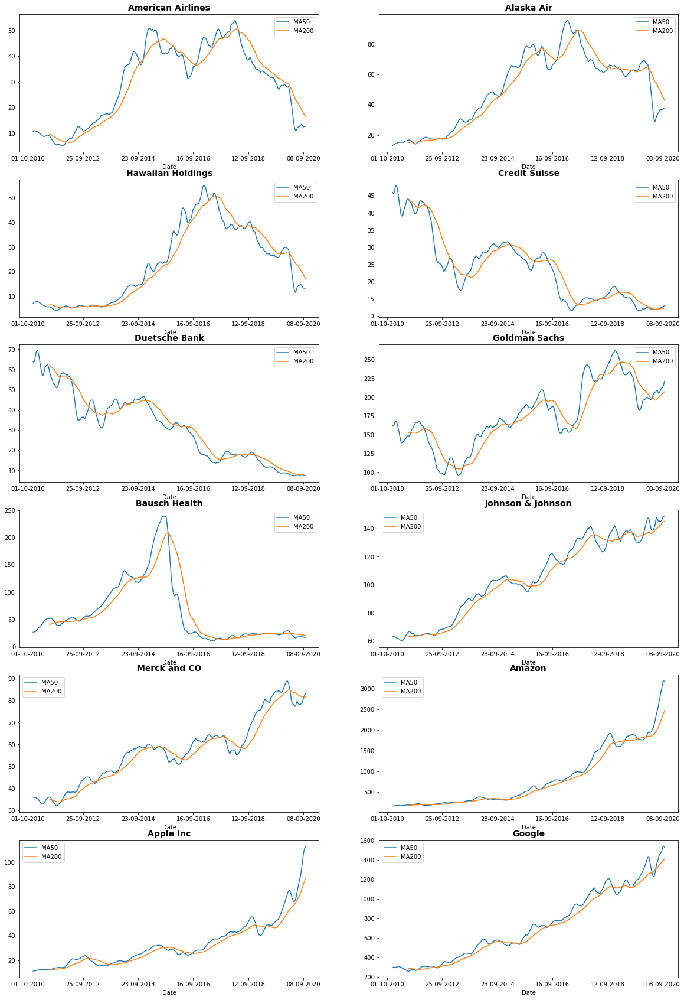

In [18]:
# moving average
fig, axes = plt.subplots(nrows=6, ncols=2)

fig.set_figheight(30)
fig.set_figwidth(20)

Stock_indexed['AAL_price'].rolling(window=50).mean().plot(ax=axes[0,0],label = 'MA50',legend= True)
Stock_indexed['AAL_price'].rolling(window=200).mean().plot(ax=axes[0,0],label = 'MA200',legend= True)
axes[0,0].set_title('American Airlines', fontsize=14, fontweight='bold')

Stock_indexed['ALK_price'].rolling(window=50).mean().plot(ax=axes[0,1],label = 'MA50',legend= True)
Stock_indexed['ALK_price'].rolling(window=200).mean().plot(ax=axes[0,1],label = 'MA200',legend= True)
axes[0,1].set_title('Alaska Air', fontsize=14, fontweight='bold')

Stock_indexed['HA_price'].rolling(window=50).mean().plot(ax=axes[1,0],label = 'MA50',legend= True)
Stock_indexed['HA_price'].rolling(window=200).mean().plot(ax=axes[1,0],label = 'MA200',legend= True)
axes[1,0].set_title('Hawaiian Holdings', fontsize=14, fontweight='bold')

Stock_indexed['CS_price'].rolling(window=50).mean().plot(ax=axes[1,1],label = 'MA50',legend= True)
Stock_indexed['CS_price'].rolling(window=200).mean().plot(ax=axes[1,1],label = 'MA200',legend= True)
axes[1,1].set_title('Credit Suisse', fontsize=14, fontweight='bold')

Stock_indexed['DB_price'].rolling(window=50).mean().plot(ax=axes[2,0],label = 'MA50',legend= True)
Stock_indexed['DB_price'].rolling(window=200).mean().plot(ax=axes[2,0],label = 'MA200',legend= True)
axes[2,0].set_title('Duetsche Bank', fontsize=14, fontweight='bold')

Stock_indexed['GS_price'].rolling(window=50).mean().plot(ax=axes[2,1],label = 'MA50',legend= True)
Stock_indexed['GS_price'].rolling(window=200).mean().plot(ax=axes[2,1],label = 'MA200',legend= True)
axes[2,1].set_title('Goldman Sachs', fontsize=14, fontweight='bold')

Stock_indexed['BHC_price'].rolling(window=50).mean().plot(ax=axes[3,0],label = 'MA50',legend= True)
Stock_indexed['BHC_price'].rolling(window=200).mean().plot(ax=axes[3,0],label = 'MA200',legend= True)
axes[3,0].set_title('Bausch Health', fontsize=14, fontweight='bold')

Stock_indexed['JNJ_price'].rolling(window=50).mean().plot(ax=axes[3,1],label = 'MA50',legend= True)
Stock_indexed['JNJ_price'].rolling(window=200).mean().plot(ax=axes[3,1],label = 'MA200',legend= True)
axes[3,1].set_title('Johnson & Johnson', fontsize=14, fontweight='bold')

Stock_indexed['MRK_price'].rolling(window=50).mean().plot(ax=axes[4,0],label = 'MA50',legend= True)
Stock_indexed['MRK_price'].rolling(window=200).mean().plot(ax=axes[4,0],label = 'MA200',legend= True)
axes[4,0].set_title('Merck and CO', fontsize=14, fontweight='bold')

Stock_indexed['AMZN_price'].rolling(window=50).mean().plot(ax=axes[4,1],label = 'MA50',legend= True)
Stock_indexed['AMZN_price'].rolling(window=200).mean().plot(ax=axes[4,1],label = 'MA200',legend= True)
axes[4,1].set_title('Amazon', fontsize=14, fontweight='bold')

Stock_indexed['AAPL_price'].rolling(window=50).mean().plot(ax=axes[5,0],label = 'MA50',legend= True)
Stock_indexed['AAPL_price'].rolling(window=200).mean().plot(ax=axes[5,0],label = 'MA200',legend= True)
axes[5,0].set_title('Apple Inc', fontsize=14, fontweight='bold')

Stock_indexed['GOOG_price'].rolling(window=50).mean().plot(ax=axes[5,1],label = 'MA50',legend= True)
Stock_indexed['GOOG_price'].rolling(window=200).mean().plot(ax=axes[5,1],label = 'MA200',legend= True)
axes[5,1].set_title('Google', fontsize=14, fontweight='bold')

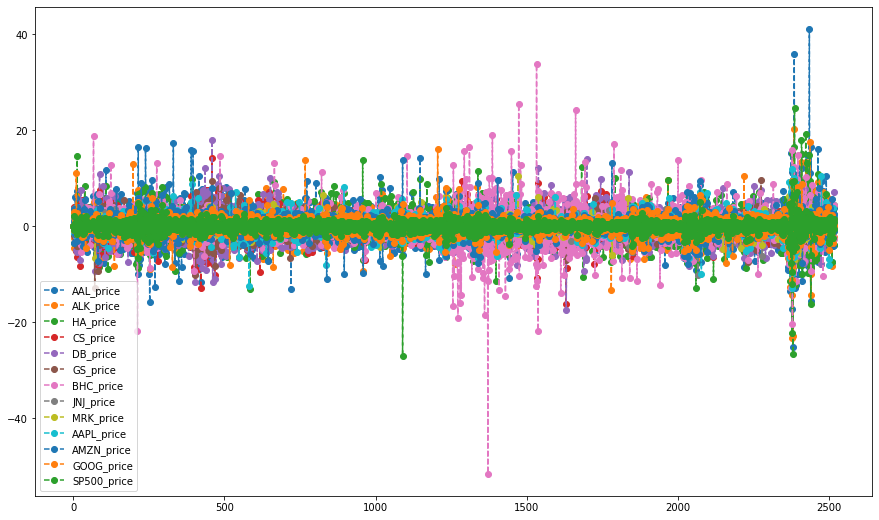

In [19]:
# Lets plot the daily return percentage of all stocks
daily_return(Stock_prices).plot(figsize=(15,9), legend=True, linestyle='--', marker='o')

### Correlation of stocks in Aviation Sector

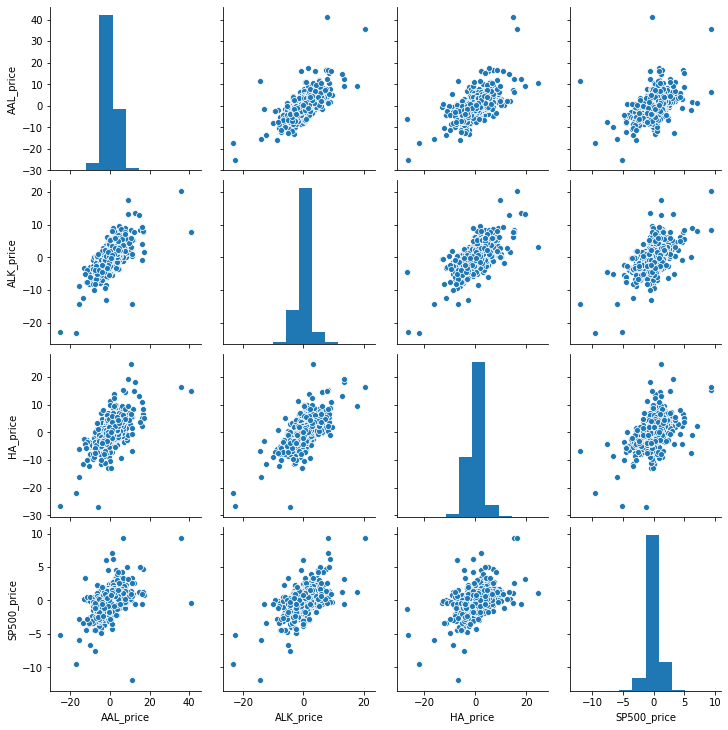

In [20]:
sns.pairplot(stocks_daily_return, vars=['AAL_price', 'ALK_price', 'HA_price','SP500_price'])
plt.show()

### Correlation of stocks in Finance Sector

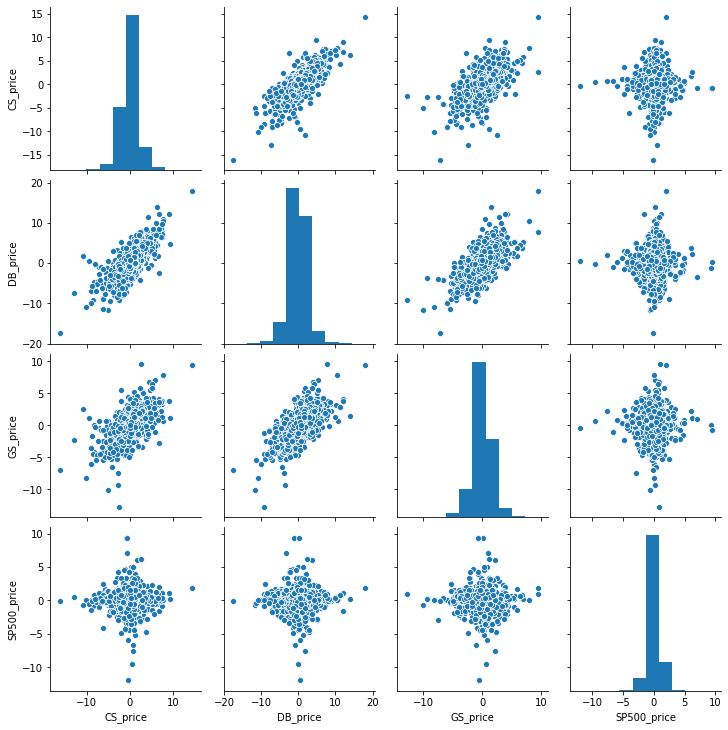

In [21]:
sns.pairplot(stocks_daily_return, vars=['CS_price', 'DB_price', 'GS_price','SP500_price'])
plt.show()

**Observation:** The plot shows positive correlation between Credit Suisse and Duetsche Bank

In [22]:
### Correlation of stocks in Healthcare_Pharma Sector

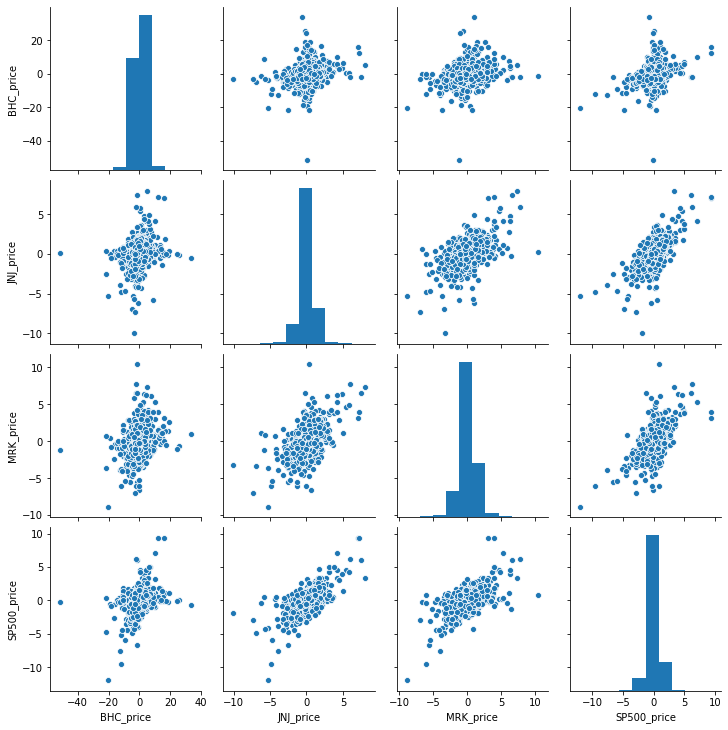

In [23]:
sns.pairplot(stocks_daily_return, vars=['BHC_price', 'JNJ_price', 'MRK_price','SP500_price'])
plt.show()

**Observation:** The plot shows that Johnson and  Merck are positively correlated

### Correlation of stocks in Technology Sector

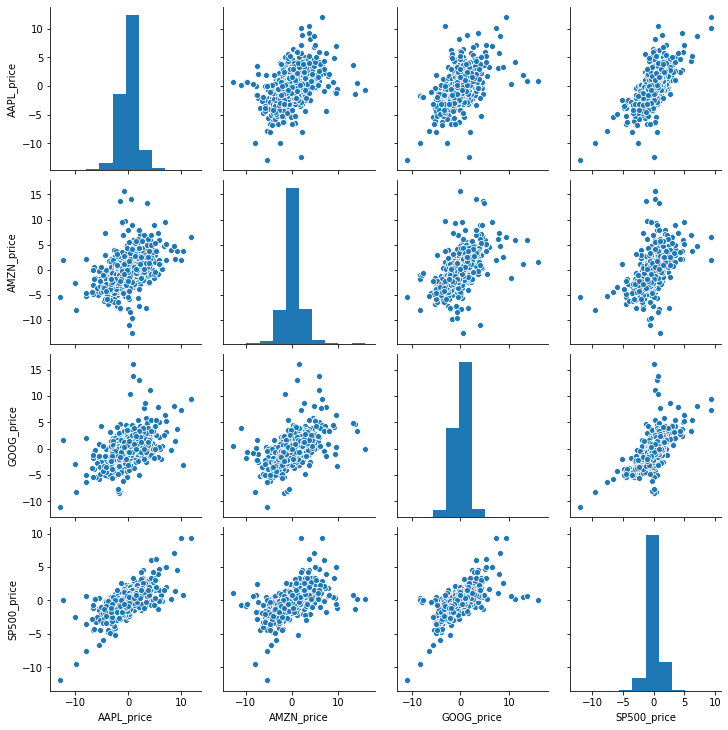

In [24]:
sns.pairplot(stocks_daily_return, vars=['AAPL_price','AMZN_price', 'GOOG_price','SP500_price'])
plt.show()

**Observation:** The plot shows that the technology stocks are positively correlated with the market

**The Daily Returns plot show huge variation in the stocks.**

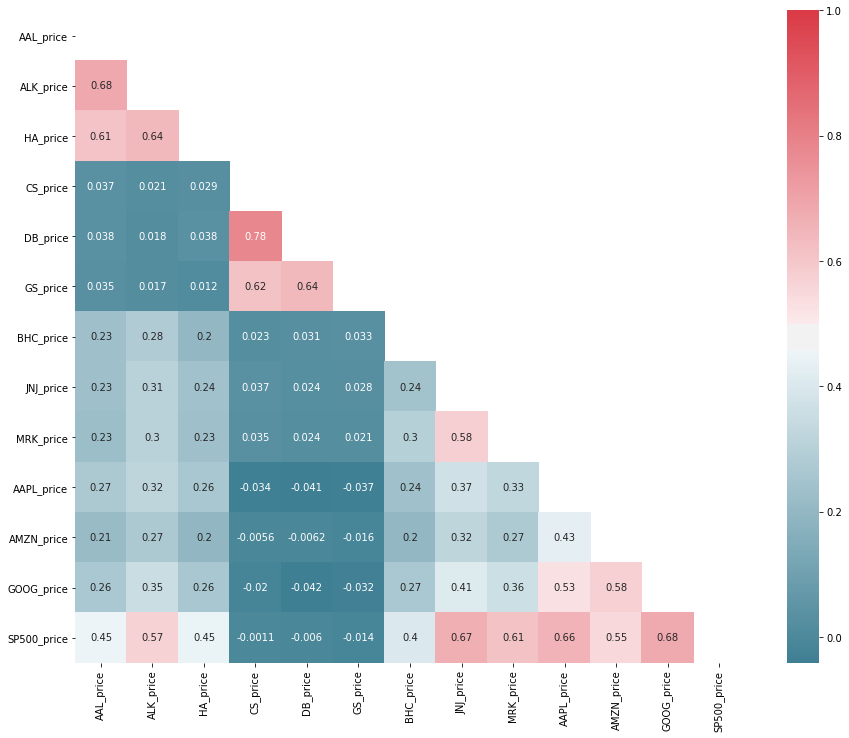

In [25]:
# use sebron for a quick correlation plot for the daily returns

# Compute the correlation matrix
corr = daily_return(Stock_prices).dropna().corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(15, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, annot = True)
plt.show()

### Observation
The Correlation is observed between:
1. ALK and AAL
2. ALK and HA
3. Cs and DB
4. JNJ and SP500
5. MRK and SP500
6. Apple and SP500
7. Google and SP500

However the correlation is not very significant

### Sharpe Ratio

The Sharpe-ratio is the average return earned in excess of the risk-free rate per unit of volatility or total risk.

The higher the Sharpe Ratio, the better a portfolio returns have been relative to the taken risk.

In [26]:
port_ret = new.mean()
port_risk = new.std()
sharpe_ratio = (port_ret/port_risk).sum()
sharpe_ratio

0.3657649929933791

In [81]:
Stock_indexed.to_csv('Clean_Data.csv')

## Calculate CAPM for a Portfolio of Stocks

#### The Capital Asset Pricing Model (CAPM) describes the relationship between the expected return of assets and the systematic risk of the market.

In [27]:
# Function to normalize the prices based on the initial price
def normalize(df):
  x = df.copy()
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

In [28]:
# Function to plot interactive plot
def interactive_plot(df, title):
  fig = px.line(title = title)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i)
  fig.show()

In [29]:
# Plot interactive chart
interactive_plot(Stock_prices, 'Prices')

In [30]:
# Plot normalized interactive chart
interactive_plot(normalize(Stock_prices), 'Normalized Prices')

In [31]:
stocks_daily_return.mean()
# S&P500 average daily return is 0.049%

AAL_price      0.063661
ALK_price      0.070921
HA_price       0.076487
CS_price      -0.030280
DB_price      -0.052832
GS_price       0.025563
BHC_price      0.046399
JNJ_price      0.040860
MRK_price      0.041010
AAPL_price     0.112719
AMZN_price     0.139707
GOOG_price     0.081723
SP500_price    0.048777
dtype: float64

## CALCULATE BETA FOR A SINGLE STOCK

In [32]:
# Select any stock, let's say Amazon 
stocks_daily_return['AMZN_price']

0       0.000000
1       1.092962
2       3.526608
3      -3.400262
4       0.559852
          ...   
2512    0.664362
2513    2.494870
2514    2.549818
2515   -0.919020
2516    0.122424
Name: AMZN_price, Length: 2517, dtype: float64

In [33]:
# Select the S&P500 (Market)
stocks_daily_return['SP500_price'].head()

0    0.000000
1   -0.803493
2    2.086134
3   -0.067200
4   -0.164652
Name: SP500_price, dtype: float64

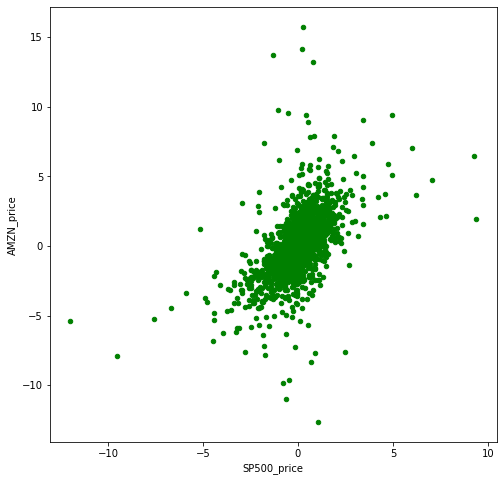

In [34]:
# plot a scatter plot between the selected stock and the S&P500 (Market)
stocks_daily_return.plot(kind = 'scatter', x = 'SP500_price', y = 'AMZN_price',figsize=(8, 8),color='green')
plt.show()

In [35]:
beta, alpha = np.polyfit(stocks_daily_return['SP500_price'], stocks_daily_return['AMZN_price'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('AMZN_price', round(beta,3), round(alpha,3))) 

Beta for AMZN_price stock is = 0.999 and alpha is = 0.091


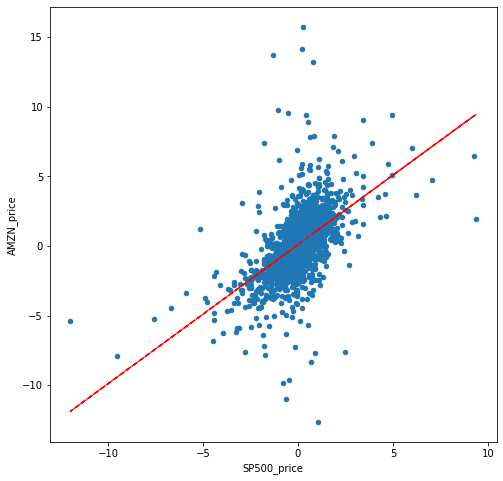

In [36]:
# Now let's plot the scatter plot and the straight line on one plot
stocks_daily_return.plot(kind = 'scatter', x = 'SP500_price', y = 'AMZN_price',figsize=(8, 8))

# Straight line equation with alpha and beta parameters 
# Straight line equation is y = beta * rm + alpha
plt.plot(stocks_daily_return['SP500_price'], beta * stocks_daily_return['SP500_price'] + alpha, '--', color = 'r')
plt.show()

## APPLY THE CAPM FORMULA TO AN INDIVIDUAL STOCK

#### Fit a polynomial between the selected stock and the S&P500 (Poly with order = 1 is a straight line)

#### Beta represents the slope of the line regression line (market return vs. stock return). 
#### Beta is a measure of the volatility or systematic risk of a security or portfolio compared to the entire market (S&P500) 
 Beta is used in the CAPM and describes the relationship between systematic risk and expected return for assets** 

- Beta = 1.0, this indicates that its price activity is strongly correlated with the market. 
- Beta < 1, indicates that the security is theoretically less volatile than the market (Ex: Utility stocks). If the stock is included, this will make the portfolio less risky compared to the same portfolio without the stock.
- Beta > 1, indicates that the security's price is more volatile than the market. For instance, Tesla stock beta is 1.26 indicating that it's 26% more volatile than the market.**


In [37]:
# Let's calculate the average daily rate of return for S&P500
stocks_daily_return['SP500_price'].mean()

0.04877662315346999

In [38]:
# Let's calculate the annualized rate of return for S&P500 
# Note that out of 365 days/year, stock exchanges are closed for 104 days during weekend days (Saturday and Sunday) 

rm = round(stocks_daily_return['SP500_price'].mean() * 252,3)
rm

12.292

In [39]:
# Assume risk free rate is the yield of a 10-years U.S. Treasury bond 
rf = 0.75 

# Calculate return for any security (APPL) using CAPM  
ER_AAPL = round(rf + ( beta * (rm-rf) ) ,3)
ER_AAPL

12.278

In [40]:
# You have to calculate Beta for AAPL_price first
beta, alpha = np.polyfit(stocks_daily_return['SP500_price'], stocks_daily_return['AAPL_price'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('AAPL_price', round(beta,3), round(alpha,3)))

Beta for AAPL_price stock is = 1.063 and alpha is = 0.061


In [41]:
# Calculate return for AAPL_price using CAPM  
ER_T = round(rf + ( beta * (rm - rf) ),3) 
print(ER_T)

13.023


In [42]:
# Let's do the same plots but in an interactive way
# Explore some wierd points in the dataset

for i in stocks_daily_return.columns:
  
  if i != 'Date' and i != 'SP500_price':
    
    # Use plotly express to plot the scatter plot for every stock vs. the S&P500
    fig = px.scatter(stocks_daily_return, x = 'SP500_price', y = i, title = i)

    # Fit a straight line to the data and obtain beta and alpha
    b, a = np.polyfit(stocks_daily_return['SP500_price'], stocks_daily_return[i], 1)
    
    # Plot the straight line 
    fig.add_scatter(x = stocks_daily_return['SP500_price'], y = b*stocks_daily_return['SP500_price'] + a)
    
    fig.show()

## CALCULATE BETA FOR ALL STOCKS

#### Beta is a measure of a stock's volatility in relation to the overall market. Beta represents the slope of the regression line, which is the market return vs. the individual stocks return.
- If the Beta of an individual stock = 1.0, this means its price is perfectly correlated with the market
- If Beta < 1.0, which is referred to as 'defensive', this indicates the security is theoretically less volatile than the market
- If Beta > 1.0, or 'aggressive', this indicates the assets price is more volatile than the market

#### Alpha describes the strategy's ability to beat the market (S&P500). Alpha indicates the “excess return” or “abnormal rate of return”. For example, a positive 0.175 alpha for Tesla means that the portfolio’s return exceeded the benchmark S&P500 index by 17%.

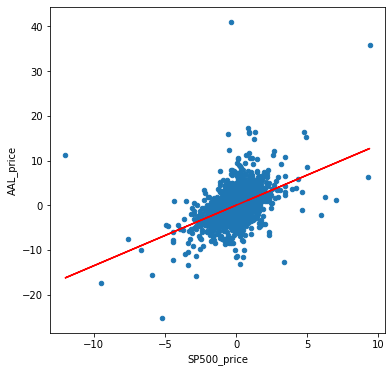

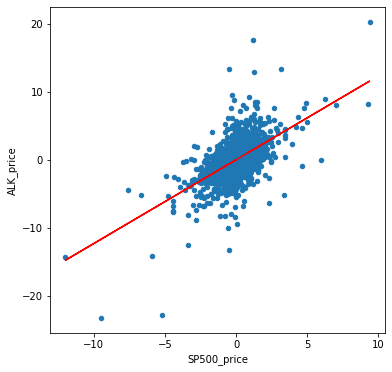

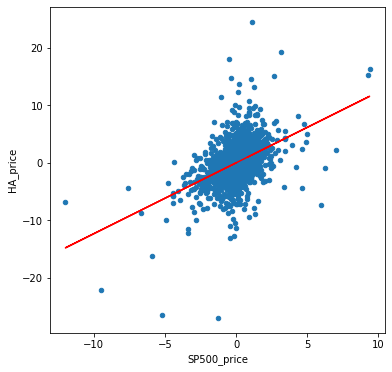

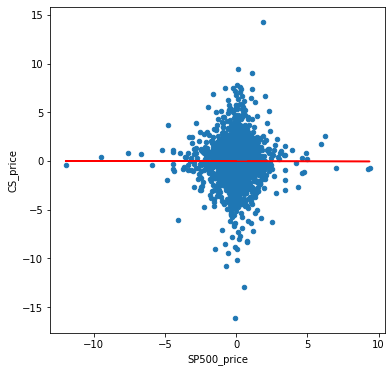

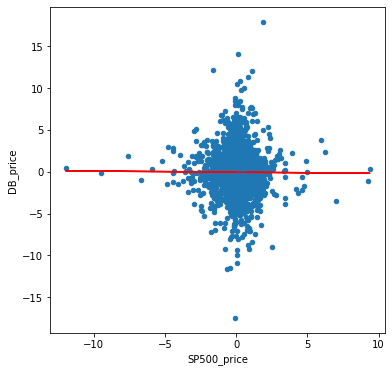

...

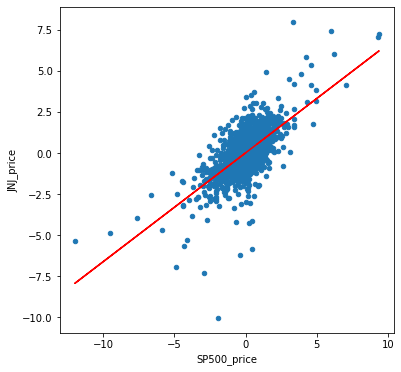

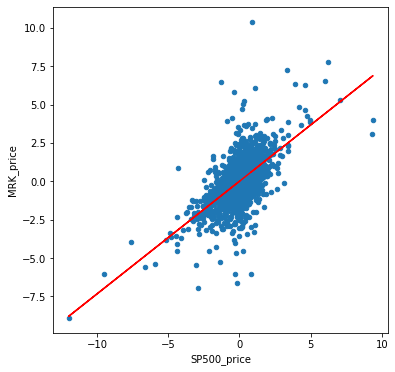

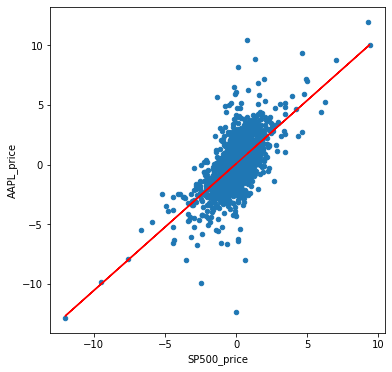

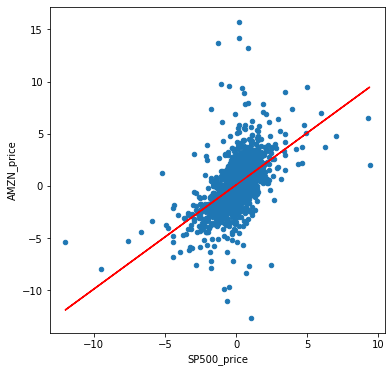

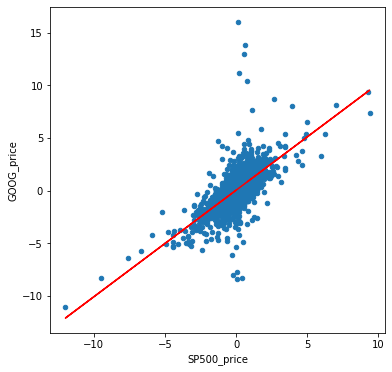

In [43]:
# Let's view alpha and Beta for every stock 
# Let's create a placeholder for all betas and alphas (empty dictionaries)
beta = {}
alpha = {}

# Loop on every stock daily return
for i in stocks_daily_return.columns:

  # Ignoring the date and S&P500 Columns 
  if i != 'Date' and i != 'SP500_price':
    # plot a scatter plot between each individual stock and the S&P500 (Market)
    stocks_daily_return.plot(kind = 'scatter', x = 'SP500_price', y = i,figsize=(6, 6))
    
    # Fit a polynomial between each stock and the S&P500 (Poly with order = 1 is a straight line)
    b, a = np.polyfit(stocks_daily_return['SP500_price'], stocks_daily_return[i], 1)
    
    plt.plot(stocks_daily_return['SP500_price'], b * stocks_daily_return['SP500_price'] + a, '-', color = 'r')
    
    beta[i] = b
    
    alpha[i] = a
    
    plt.show()

In [44]:
# Obtain a list of all stock names
keys = list(beta.keys())
keys

['AAL_price',
 'ALK_price',
 'HA_price',
 'CS_price',
 'DB_price',
 'GS_price',
 'BHC_price',
 'JNJ_price',
 'MRK_price',
 'AAPL_price',
 'AMZN_price',
 'GOOG_price']

In [45]:
# Define the expected return dictionary
ER = {}

rf = 0.75 # return rate of 10 year U.S. treasury bond
rm = round(stocks_daily_return['SP500_price'].mean() * 252,3) # this is the expected return of the market 
print('Expected return of the market SP500 is',rm)

Expected return of the market SP500 is 12.292


In [46]:
for i in keys:
  print("beta value for {} is {}".format(i,beta[i]))

beta value for AAL_price is 1.3536094251202482
beta value for ALK_price is 1.2315117659947987
beta value for HA_price is 1.2335342073980324
beta value for CS_price is -0.002015609640860238
beta value for DB_price is -0.013783770268235443
beta value for GS_price is -0.021291725019227693
beta value for BHC_price is 1.3159707499732263
beta value for JNJ_price is 0.662233123245481
beta value for MRK_price is 0.7334755720421169
beta value for AAPL_price is 1.0633500659817672
beta value for AMZN_price is 0.9988037994741069
beta value for GOOG_price is 1.0133385544703524


**Stocks with stable beta values and which are strongly correlated with the market are** -

**1. Alaska Air**

**2. Hawaiian Holdings**

**3. Apple**

**4. Amazon**

**5. Google**

In [47]:
for i in keys:
  # Calculate return for every security using CAPM  
  ER[i] = rf + ( beta[i] * (rm-rf) ) 

In [48]:
for i in keys:
  print('Expected Return Based on CAPM for {} is {}%'.format(i, round(ER[i],3)))

Expected Return Based on CAPM for AAL_price is 16.373%
Expected Return Based on CAPM for ALK_price is 14.964%
Expected Return Based on CAPM for HA_price is 14.987%
Expected Return Based on CAPM for CS_price is 0.727%
Expected Return Based on CAPM for DB_price is 0.591%
Expected Return Based on CAPM for GS_price is 0.504%
Expected Return Based on CAPM for BHC_price is 15.939%
Expected Return Based on CAPM for JNJ_price is 8.393%
Expected Return Based on CAPM for MRK_price is 9.216%
Expected Return Based on CAPM for AAPL_price is 13.023%
Expected Return Based on CAPM for AMZN_price is 12.278%
Expected Return Based on CAPM for GOOG_price is 12.446%


In [49]:
# Assume equal weights in the portfolio
portfolio_weights = 1/12 * np.ones(12) 
portfolio_weights

array([0.08333333, 0.08333333, 0.08333333, 0.08333333, 0.08333333,
       0.08333333, 0.08333333, 0.08333333, 0.08333333, 0.08333333,
       0.08333333, 0.08333333])

In [50]:
# Calculate the portfolio return 
ER_portfolio_all = round(sum(list(ER.values()) * portfolio_weights),3)
print('Expected Return Based on CAPM for the portfolio is {}%\n'.format(ER_portfolio_all))

Expected Return Based on CAPM for the portfolio is 9.954%



#### Inference:    Suggested not to invest, Returns are lesser than S&P 500

In [51]:
# Calculate the portfolio return for Aviation sector
ER_portfolio_Aviation = round(0.33 * ER['AAL_price'] +  0.33 * ER['ALK_price'] + 0.34 * ER['HA_price'],3)
print('Expected Return Based on CAPM for the portfolio (Aviation Sector) is {}%\n'
      .format(ER_portfolio_Aviation))

Expected Return Based on CAPM for the portfolio (Aviation Sector) is 15.437%



#### Inference:    Suggested to invest, Returns are better than S&P 500

In [52]:
# Calculate the portfolio return for Finance sector 
ER_portfolio_Finance = round(0.33 * ER['CS_price'] +  0.33 * ER['DB_price'] + 0.34 * ER['GS_price'],3)
print('Expected Return Based on CAPM for the portfolio (Finance Sector) is {}%\n'
      .format(ER_portfolio_Finance))

Expected Return Based on CAPM for the portfolio (Finance Sector) is 0.606%



#### Inference:    Suggested not to invest, Returns are worse than S&P 500

In [53]:
# Calculate the portfolio return for Healthcare_Pharma sector 
ER_portfolio_Healthcare_Pharma = round(0.33 * ER['BHC_price'] +  0.33 * ER['JNJ_price'] + 0.34 * ER['MRK_price'],3)
print('Expected Return Based on CAPM for the portfolio (Healthcare_Pharma Sector) is {}%\n'
      .format(ER_portfolio_Healthcare_Pharma))

Expected Return Based on CAPM for the portfolio (Healthcare_Pharma Sector) is 11.163%



#### Inference:    Suggested not to invest, Returns are lesser than S&P 500

In [54]:
# Calculate the portfolio return for Technology sector 
ER_portfolio_Technology = round(0.33 * ER['AAPL_price'] +  0.33 * ER['AMZN_price'] + 0.34 * ER['GOOG_price'],3)
print('Expected Return Based on CAPM for the portfolio (Technology Sector) is {}%\n'
      .format(ER_portfolio_Technology))

Expected Return Based on CAPM for the portfolio (Technology Sector) is 12.581%



#### Inference:    Suggested to invest, Returns are better than S&P 500

In [55]:
sum=0
for i in keys:
    sum=sum+ER[i] 
for i in keys:
  print('Contribution on CAPM for {} is {}'.format(i, round(ER[i]/sum,2)))

Contribution on CAPM for AAL_price is 0.14
Contribution on CAPM for ALK_price is 0.13
Contribution on CAPM for HA_price is 0.13
Contribution on CAPM for CS_price is 0.01
Contribution on CAPM for DB_price is 0.0
Contribution on CAPM for GS_price is 0.0
Contribution on CAPM for BHC_price is 0.13
Contribution on CAPM for JNJ_price is 0.07
Contribution on CAPM for MRK_price is 0.08
Contribution on CAPM for AAPL_price is 0.11
Contribution on CAPM for AMZN_price is 0.1
Contribution on CAPM for GOOG_price is 0.1


In [56]:
ER_portfolio_b = round(.14 * ER['AAL_price'] +  .13 * ER['ALK_price'] + 0.13 * ER['HA_price']  + .01 * ER['CS_price']+ 
                       .13 * ER['BHC_price'] +  .07 * ER['JNJ_price'] + .08  * ER['MRK_price'] + .11 * ER['AAPL_price']+
                       .1 * ER['AMZN_price'] +  .1  * ER['GOOG_price'] ,3 )
print('Expected Return Based on CAPM for the portfolio (Balanced Weightage) is {}%\n'
      .format(ER_portfolio_b))

Expected Return Based on CAPM for the portfolio (Balanced Weightage) is 13.495%



#### Inference:    Suggested to invest, Returns are better than S&P 500

In [57]:
ER_portfolio_hp = round(.14 * ER['AAL_price'] +  .14 * ER['ALK_price'] +  .14 * ER['HA_price']  + .14 * ER['BHC_price'] + 
                        .14 * ER['AAPL_price']+  .14 * ER['AMZN_price'] + .14  * ER['GOOG_price'] ,3 )
print('Expected Return Based on CAPM for the portfolio (High performing) is {}%\n'
      .format(ER_portfolio_hp))

Expected Return Based on CAPM for the portfolio (High performing) is 14.002%



#### Inference:    Suggested to invest, Returns are better than S&P 500

In [58]:
# Calculate the portfolio return 
ER_portfolio_lp = round(0.2 * ER['CS_price'] +  0.2 * ER['DB_price'] + 0.2 * ER['GS_price'] + 0.2 * ER['JNJ_price'] 
                        + 0.2 * ER['MRK_price'],3)
print('Expected Return Based on CAPM for the portfolio (Weak performing) is {}%\n'
      .format(ER_portfolio_lp))

Expected Return Based on CAPM for the portfolio (Weak performing) is 3.886%



#### Inference:    Suggested not to invest, Returns are worse than S&P 500

In [59]:
ER_portfolio_ap = round(.33 * ER['AAPL_price']+  .33 * ER['AMZN_price'] + .34  * ER['GOOG_price'] ,3)
print('Expected Return Based on CAPM for the portfolio (Average performing) is {}%\n'
      .format(ER_portfolio_ap))

Expected Return Based on CAPM for the portfolio (Average performing) is 12.581%



#### Inference:    Suggested to invest, Returns are better than S&P 500

In [60]:
# Calculate the portfolio return for extremes(both highest and lowest)
ER_portfolio_ed = round(  0.5 * ER['GS_price'] +  0.5 * ER['AAL_price'] ,3)
print('Expected Return Based on CAPM for the portfolio (Extremes) is {}%\n'
      .format(ER_portfolio_ed))


Expected Return Based on CAPM for the portfolio (Extremes) is 8.439%



#### Inference:    Suggested not to invest, Returns are lesser than S&P 500

In [61]:
data = {'Combinations':['AAL_price', 'ALK_price', 'HA_price','CS_price', 'DB_price', 'GS_price','BHC_price', 'JNJ_price', 
                        'MRK_price','AAPL_price','AMZN_price', 'GOOG_price', 
                        'Aviation Sector','Finance Sector','Healthcare_Pharma Sector','Technology Sector',
                        'Balanced Weightage','High performing','Weak performing','Average performing','Extremes'], 
        'Expected Return Based on CAPM':[16.405, 14.985, 15.008, 0.637, 0.5, 0.412, 15.967, 8.363, 9.192, 13.029, 12.278,12.447,
                                       15.462, 0.515, 11.154, 12.583, 13.504, 14.017, 3.821, 12.583, 8.409 ]} 
Returns = pd.DataFrame(data)
Returns.sort_values(by='Expected Return Based on CAPM', ascending=False,inplace=True)
Returns

,Combinations,Expected Return Based on CAPM
0,AAL_price,16.405
6,BHC_price,15.967
12,Aviation Sector,15.462
2,HA_price,15.008
1,ALK_price,14.985
17,High performing,14.017
16,Balanced Weightage,13.504
9,AAPL_price,13.029
19,Average performing,12.583
15,Technology Sector,12.583


In [62]:
print("Top 10 Suggested Portfolio :") 
Returns[:10]

Top 10 Suggested Portfolio :


,Combinations,Expected Return Based on CAPM
0,AAL_price,16.405
6,BHC_price,15.967
12,Aviation Sector,15.462
2,HA_price,15.008
1,ALK_price,14.985
17,High performing,14.017
16,Balanced Weightage,13.504
9,AAPL_price,13.029
19,Average performing,12.583
15,Technology Sector,12.583


In [63]:
print("Bottom 5 Portfolio to avoid:") 
Returns.tail()

Bottom 5 Portfolio to avoid:


,Combinations,Expected Return Based on CAPM
18,Weak performing,3.821
3,CS_price,0.637
13,Finance Sector,0.515
4,DB_price,0.500
5,GS_price,0.412


### The top 10 suggested portfolio stocks is only based on the returns. To have a stable portfolio with minimal risk as required by our client we need to also consider beta values.
### Hence the final portfolio is the one which has returns higher than the market and beta values closer to 1.

In [64]:
# final stocks chosen
final_stocks = Stock_indexed[['ALK_price', 'HA_price', 'AAPL_price', 'AMZN_price', 'GOOG_price']]
final_stocks.head()

,ALK_price,HA_price,AAPL_price,AMZN_price,GOOG_price
Date,,,,,
01-10-2010,12.4475,5.96,10.090000,153.710007,261.828613
04-10-2010,12.1425,5.75,9.951428,155.389999,260.199707
05-10-2010,12.2150,5.85,10.319285,160.869995,268.110046
06-10-2010,12.1875,5.97,10.328215,155.399994,266.177307
07-10-2010,11.6250,6.15,10.329286,156.270004,264.015411


### Time-dependent variables

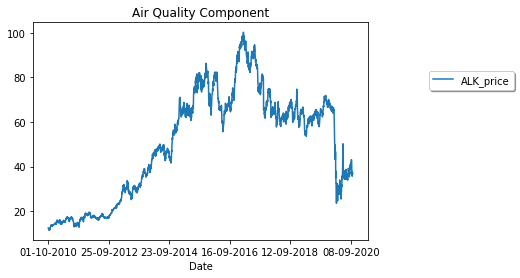

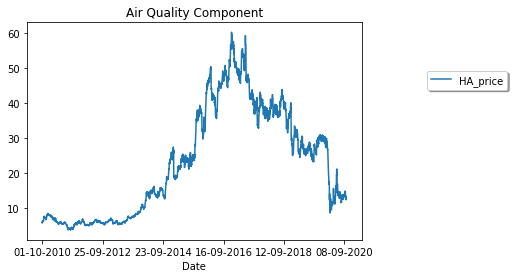

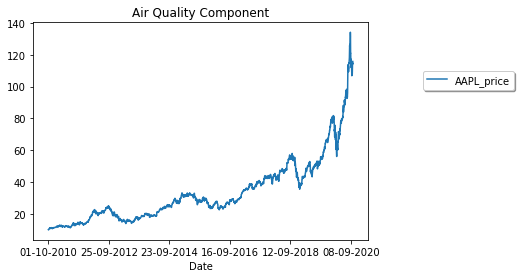

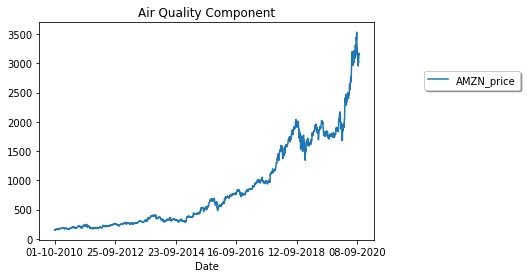

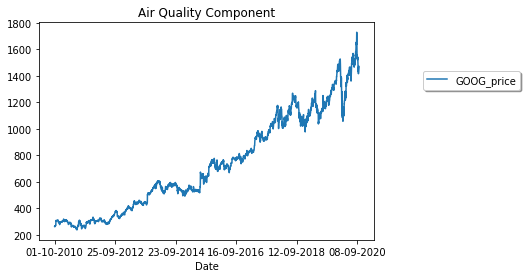

In [65]:
# Visualize the trends in data for each column to identify the variables which vary with time

for i in final_stocks.columns:
    final_stocks[i].plot(kind = 'line', legend = 'reverse', title = 'Air Quality Component')
    plt.legend(loc = 'upper right', shadow = True, bbox_to_anchor = (1.45, 0.8))
    plt.show()

### Stationarity Tests

In [66]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity
# Creating a function for testing all the columns

from statsmodels.tsa.stattools import kpss

for col in final_stocks.columns:
    kpss_test = kpss(final_stocks[col])
    
    print(col)
    print('KPSS Statistic: %f' % kpss_test[0])
    print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
    print('p-value: %f' % kpss_test[1])
    
    if kpss_test[1] <= 0.05:
        print("\nSeries is Stationary")
    else:
        print("\nSeries is Non-Stationary")
        
    print('\n--------------------------------------\n')

ALK_price
KPSS Statistic: 5.534522
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

HA_price
KPSS Statistic: 5.247637
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

AAPL_price
KPSS Statistic: 6.756153
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

AMZN_price
KPSS Statistic: 7.681389
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

GOOG_price
KPSS Statistic: 8.721507
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------



**All the series are stationary. Hence, differencing is required not for any columns.**

### Train-test split

In [67]:
# Keeping 70% values as train
train_len = int(final_stocks.shape[0]*0.8)
test_len = int(final_stocks.shape[0]) - int(final_stocks.shape[0]*0.8)

# Train data
train_data = final_stocks[:train_len] 

# Test data
test_data = final_stocks[train_len:]

### Model Fitting

In [68]:
# Fitting the VAR model to the data

model = VAR(train_data)

In [69]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,31.91,31.92,7.201e+13,31.91
1,5.794*,5.879*,328.3*,5.825*
2,5.799,5.955,329.9,5.856
3,5.805,6.033,332.1,5.889
4,5.806,6.104,332.2,5.915
5,5.809,6.179,333.2,5.945
6,5.817,6.258,335.9,5.979
7,5.813,6.325,334.6,6.001
8,5.824,6.407,338.3,6.038
9,5.830,6.484,340.4,6.071


In [70]:
# Providing maxlags as 1 (minimum AIC vaue)
results = model.fit(maxlags = 1, ic = 'aic')

In [71]:
# Printing the results - Evaluation parameters, lag coefficients, etc.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 13, Sep, 2021
Time:                     23:15:55
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                    5.77237
Nobs:                     2012.00    HQIC:                   5.71946
Log likelihood:          -19967.4    FPE:                    295.530
AIC:                      5.68877    Det(Omega_mle):         291.163
--------------------------------------------------------------------
Results for equation ALK_price
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.040309         0.112732            0.358           0.721
L1.ALK_price          0.993998         0.003384          293.700           0.000
L1.HA_price           0.007985         0.004486         

In [72]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 1

In [73]:
# Obtaining the forecast values
predicted = results.forecast(train_data.values[-lag_order:], test_len)
forecast = pd.DataFrame(predicted, index = final_stocks.index[train_len:], columns = final_stocks.columns)

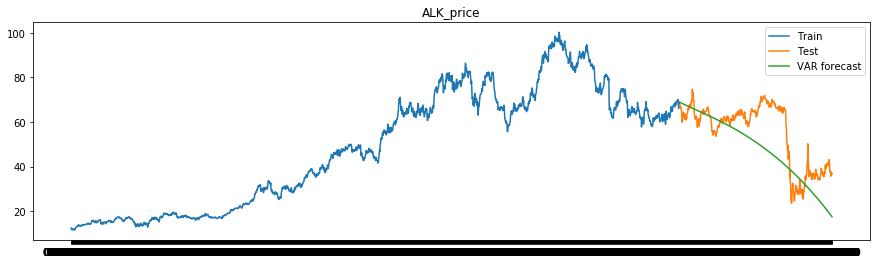

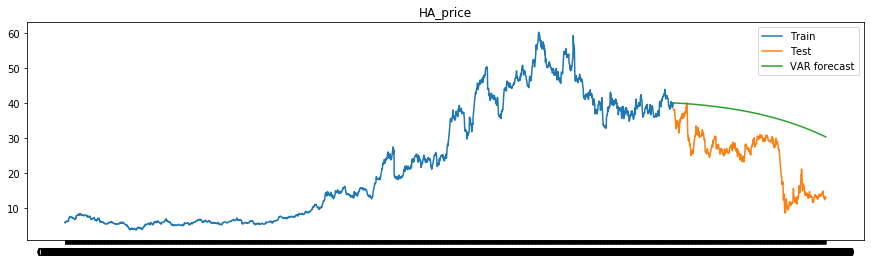

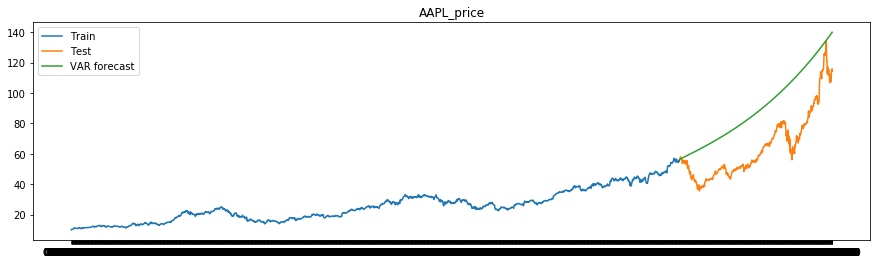

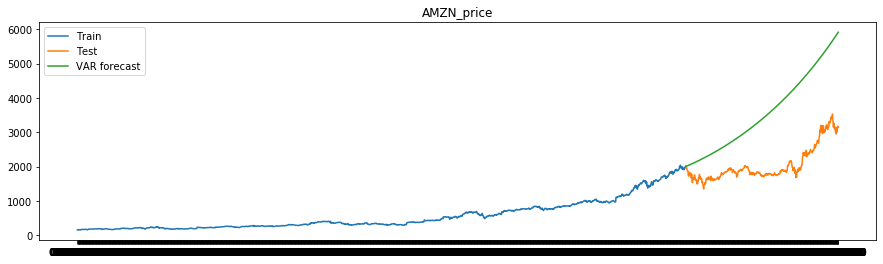

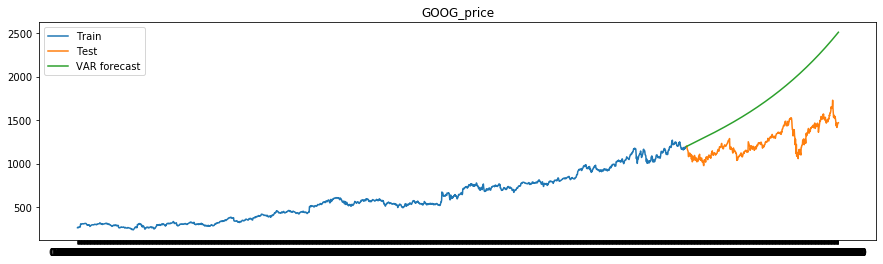

In [74]:
# Printing the train, test and forecasted values
for col in final_stocks.columns:
    plt.figure(figsize=(15,4))
    plt.plot(final_stocks[col][:train_len], label='Train')
    plt.plot(final_stocks[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

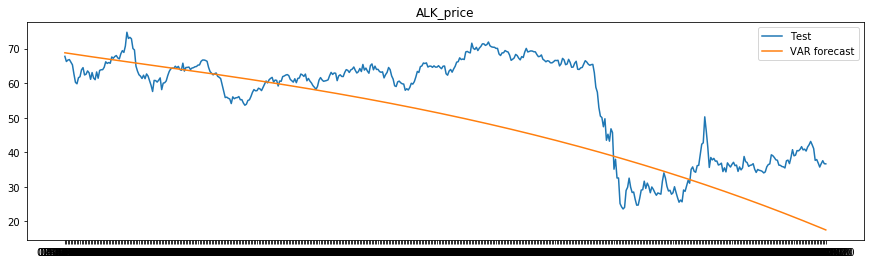

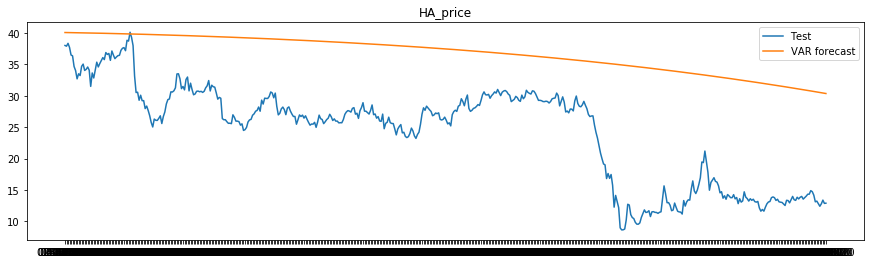

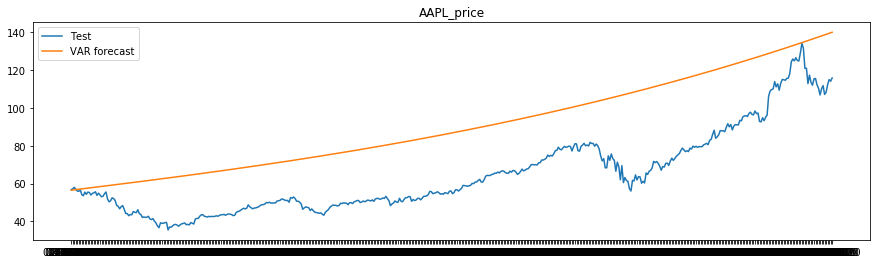

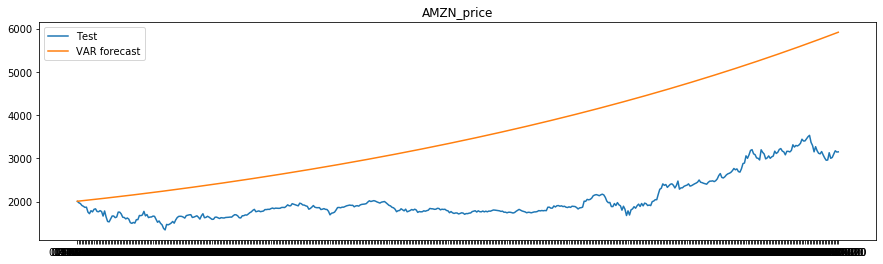

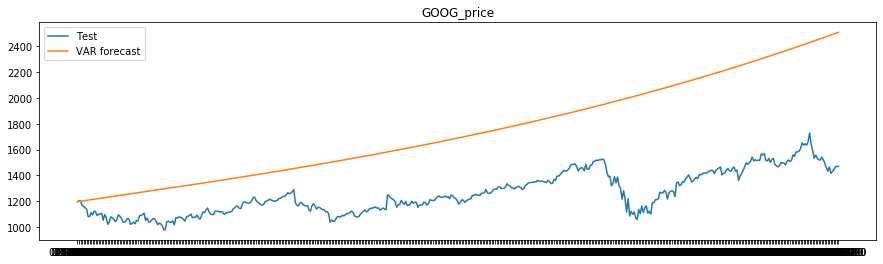

In [75]:
# Comparing the test and forecasted values
for col in final_stocks.columns:
    plt.figure(figsize=(15,4))
    plt.plot(final_stocks[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

In [76]:
# Model Evaluation
from sklearn.metrics import mean_squared_error

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in final_stocks.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

,Column,RMSE,MAPE
0,ALK_price,12.34,18.85
0,HA_price,13.55,68.70
0,AAPL_price,27.59,43.43
0,AMZN_price,1702.21,73.62
0,GOOG_price,546.34,37.75


In [77]:
final_stocks.describe()

,ALK_price,HA_price,AAPL_price,AMZN_price,GOOG_price
count,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,50.031176,22.870413,33.454670,854.636107,730.426139
std,24.187020,15.483034,20.630118,745.201139,364.685720
min,11.620000,3.780000,9.951428,153.029999,236.553345
25%,26.780001,7.030000,18.961428,266.489990,403.642059
50%,58.540001,21.910000,27.592501,533.750000,651.789978
75%,67.260002,36.900002,42.962502,1500.000000,1055.810059
max,100.239998,60.299999,134.179993,3531.449951,1728.280029


In [78]:
#Average daily return of the portfolio
final_stocks_return = final_stocks.pct_change().mean()
final_stocks_return = final_stocks_return.sum()
final_stocks_return

0.004817477899992408

In [79]:
#Annalized returns from the final portfolio is calulated by multiplying number of trading days in a year with daily returns
Final_Returns = (252 * final_stocks_return)
print("The Final Returns is ", round(Final_Returns*100,2))

The Final Returns is  121.4


In [80]:
#The Expected returns for the portfolio based on CAPM for final stocks is = Returns of (ALK + HA + AAPL + AMZN + GOOG)
Total_returns  = 14.964 + 14.987 + 13.023 + 12.278 + 12.446
print(round(Total_returns,2))

67.7


### Conclusion: 
Based on CAPM approach, the stocks with returns greater than market SP500 and are also stable with lower risk (beta values around 1) are -

**1. Google**

**2. Amazon**

**3. Alaska Airlines**

**4. Apple Inc**

**5. Hawaiian Holdings**

The expected returns for the portfolio with these stocks is 121.4% with no risk considered.

The expected returns for the portfolio with these stocks is 67.7% with risk = 0.75.

Hence it looks like a good portfolio with decent returns which is suitable for Alexandra's risk appetite and returns expectation.